# Prepare the environments for this set of experiments

In [25]:
import sys
sys.path.append('../../')
from panav.environment.env import Room, MultiTunnelEnv, WareHouse
from panav.viz import draw_env,draw_hybrid
from panav.hybrid import HybridGraph

from time import time
import pickle as pkl

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [26]:
def get_env_name(filename):
    fs = filename.split('.')
    return fs[0]

In [81]:
from panav.sequential import sequential_HybridSIPP, sequential_planning
from panav.SAMP.solvers import Tube_Planning
from benchmarks.ST_RRTStar_wrapper import sequential_ST_RRTStar 
from panav.PIBT import PIBT_plan
from os import listdir

bloating_r = 0.5
vmax = 1.0

TIMEOUT = 200

# Specify the Algorithms
algs = {  
        "MILP": lambda HG: sequential_planning(Tube_Planning,HG.env,vmax,bloating_r,TIMEOUT=TIMEOUT), 
        "ST-RRT*": lambda HG: sequential_ST_RRTStar(HG.env,vmax,bloating_r),
        "PIBT": lambda HG: PIBT_plan(HG,vmax,bloating_r,TIMEOUT,simple_plan=False),
        "HybridSIPP": lambda HG: sequential_HybridSIPP(HG)
        }
# Load environment presets
env_names = [get_env_name(fn) for fn in listdir('./envs')]

env_info = {}

for name in env_names:
    with open(f'./envs/{name}.pkl','rb') as fp:
        env_info[name] = pkl.load(fp)

Building the environment...


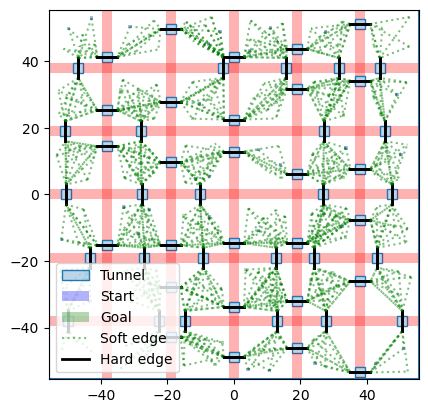

In [91]:
import numpy as np
env_name = 'Room'
SEED = 13981
np.random.seed(SEED)  # Fix the random seed

N = 30

env_i = env_info[env_name]
# Construct the environment
constructor = env_i['constructor']
specs = env_i['specs']

print('Building the environment...')
env = constructor(**specs,N_agent = N)
draw_hybrid(env,display_node=False,display_soft=True)

In [92]:
plans = algs['HybridSIPP'](env)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
MILP low-level encounters infeasibility.
19
20
21
22
23
24
25
MILP low-level encounters infeasibility.
MILP low-level encounters infeasibility.
MILP low-level encounters infeasibility.
26
27
28
MILP low-level encounters infeasibility.
29


In [77]:
from matplotlib import pyplot as plt
from panav.viz import animation
from IPython.display import HTML, display
from matplotlib import rcParams
from panav.util import interpolate_positions


exec_tau = 1.0

rcParams['animation.embed_limit'] = 2**128
dt = exec_tau 
agents = range(len(plans))
pos_to_ani = [p[1] for p in plans]

# for cp in plans:
#     _,xs = interpolate_positions(*cp,dt)
#     pos_to_ani.append(xs)
    
anim = animation(env.env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
plt.close() 

Building the environment...


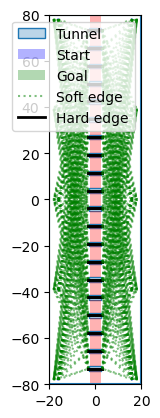

In [23]:
import numpy as np
env_name = 'MultiTunnel'
SEED = 13981
np.random.seed(SEED)  # Fix the random seed

N = 10

env_i = env_info[env_name]
# Construct the environment
constructor = env_i['constructor']
specs = env_i['specs']

print('Building the environment...')
env = constructor(**specs,N_agent = N)
draw_hybrid(env,display_node=False,display_soft=True)

In [1]:
import numpy as np
env_name = 'WareHouse'
SEED = 13981
np.random.seed(SEED)  # Fix the random seed

N = 100

env_i = env_info[env_name]
# Construct the environment
constructor = env_i['constructor']
specs = env_i['specs']

print('Building the environment...')
HG = constructor(**specs,N_agent = N)
draw_hybrid(HG,display_node=False)

NameError: name 'env_info' is not defined

KeyboardInterrupt: 

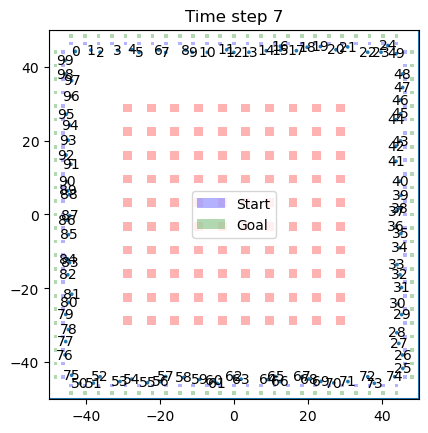

In [61]:
from matplotlib import pyplot as plt
from panav.viz import animation
from IPython.display import HTML, display
from matplotlib import rcParams
from panav.util import interpolate_positions


exec_tau = 1.0

rcParams['animation.embed_limit'] = 2**128
dt = exec_tau 
agents = range(len(plans))
pos_to_ani = [p[1] for p in plans]

# for cp in plans:
#     _,xs = interpolate_positions(*cp,dt)
#     pos_to_ani.append(xs)
    
anim = animation(HG.env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
plt.close() 